In [7]:
! pip install -U pip setuptools wheel
! pip install -U spacy
! python -m spacy download en_core_web_sm

     |████████████████████████████████| 2.1 MB 5.2 MB/s 
     |████████████████████████████████| 1.1 MB 41.9 MB/s 
  Attempting uninstall: setuptools
    Found existing installation: setuptools 57.4.0
    Uninstalling setuptools-57.4.0:
      Successfully uninstalled setuptools-57.4.0
  Attempting uninstall: pip
    Found existing installation: pip 21.1.3
    Uninstalling pip-21.1.3:
      Successfully uninstalled pip-21.1.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.8.0 requires tf-estimator-nightly==2.8.0.dev2021122109, which is not installed.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 43.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 KB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.6/181.6 KB 19.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 452.0/452.0 KB 32.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 653.3/653.3 KB 38.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 61.8 MB/s eta 0:00:00
  Attempting uninstall: catalogue
    Found existing installation: catalogue 1.0.0
    Uninstalling catalogue-1.0.0:
      Successfully uninstalled catalogue-1.0.0
  Attempting uninstall: srsly
    Found existing installation: srsly 1.0.5
    Uninstalling srsly-1.0.5:
      Successfully uninstalled srsly-1.0.5
  Attempting uninstall: thinc
    Found existing installation: thinc 7.4.0
    Uninstalling thinc-7.4.0:
      Successfully uninstalled thinc-7.4.0
  Attempting uninstall: spacy
    Found existing installa

# Step1: Upload data

In [8]:
# upload file from local drive and open it for reading (NOTEEVENTS file)
from google.colab import files
uploaded = files.upload()

Saving NOTEEVENTS_2.csv to NOTEEVENTS_2.csv


In [10]:
import pandas as pd

dt =pd.read_csv('NOTEEVENTS_2.csv')
print(dt.shape)
dt.head()

(50, 11)


,ROW_ID,SUBJECT_ID,HADM_ID,CHARTDATE,CHARTTIME,STORETIME,CATEGORY,DESCRIPTION,CGID,ISERROR,TEXT
0,25,57578,158315,2119-05-18,NaN,NaN,Discharge summary,Report,NaN,NaN,Admission Date: [**2119-5-12**] ...
1,26,2961,130443,2109-04-03,NaN,NaN,Discharge summary,Report,NaN,NaN,Admission Date: [**2109-3-14**] Dischar...
2,27,23194,107478,2157-04-18,NaN,NaN,Discharge summary,Report,NaN,NaN,Admission Date: [**2157-4-9**] D...
3,28,23194,164553,2157-05-14,NaN,NaN,Discharge summary,Report,NaN,NaN,Admission Date: [**2157-5-11**] ...
4,29,23194,190448,2157-06-01,NaN,NaN,Discharge summary,Report,NaN,NaN,Admission Date: [**2157-5-31**] ...


In [11]:
dt_notes = dt['TEXT'].copy()
dt_notes.head(10)

0    Admission Date:  [**2119-5-12**]              ...
1    Admission Date:  [**2109-3-14**]       Dischar...
2    Admission Date:  [**2157-4-9**]              D...
3    Admission Date:  [**2157-5-11**]              ...
4    Admission Date:  [**2157-5-31**]              ...
5    Admission Date:  [**2128-5-5**]       Discharg...
6    Admission Date:  [**2128-5-5**]       Discharg...
7    Admission Date:  [**2128-5-12**]       Dischar...
8    Admission Date:  [**2196-10-14**]             ...
9    Admission Date: [**2126-7-29**]        Dischar...
Name: TEXT, dtype: object

In [15]:
# upload file from local drive and open it for reading (50PatientDischargeNote-Headache.txt file)
from google.colab import files
uploaded = files.upload()

Saving 50PatientDischargeNote-Headache.txt to 50PatientDischargeNote-Headache.txt


In [16]:
notes = []
with open('50PatientDischargeNote-Headache.txt', 'r') as fin:
  lines = fin.readlines()
  for line in lines:
    notes.append(line)
print(notes)
print(len(notes))

["Service: MEDICINE Allergies: Penicillins / Adhesive Tape Attending:[**First Name3 (LF) 2817**] Chief Complaint: tachypnea and mental status changes Major Surgical or Invasive Procedure: none History of Present Illness: 65 yo man with CHF, DVT, ESRD on HD, metastatic poorly differentiated CA, likely NSLCA recently discharged [**4-5**] after hospitalization for cauda equina syndrome treated with XRT. This afternoon, noted to be very tachycardic and tachypnic en route to [**Hospital3 2558**] after HD, so EMS brought pt to ED. . In the ED, he was given 750mg iv levofloxacin for possible LLL airspace disease, though progression of metastatic malignancy more likely and CT chest did not show consolidation. Past Medical History: #. Onc HX: [**12-11**] pre-renal transplant CT scan chest noted enlarged RML nodule, w/ subcentimeter FDG avid scattered lymph nodes. Developed neck pain and found to have C2 pathological fracture, [**11-22**] cytology demonstrated poorly differentiated carcinoma. Li

##Step2: Tokenization

In [18]:
import spacy

tokenized_docs = []
nlp = spacy.load('en_core_web_sm')

for i in range(len(dt_notes)):
  doc = nlp(dt_notes[i])

  tokenized_docs.append([token for token in doc if not token.is_space | token.is_punct | token.is_stop])

for i in range(5):
  print(tokenized_docs[i])


[Admission, Date, 2119, 5, 12, Discharge, Date, 2119, 5, 18, Date, Birth, 2079, 3, 9, Sex, M, Service, SURGERY, Allergies, Percocet, Lisinopril, Attending:[**First, Name3, LF, 301, Chief, Complaint, substernal, chest, pain, Major, Surgical, Invasive, Procedure, 1, Closure, perforated, ulcer, 2, Partial, gastrectomy, 3, Cholecystectomy, 4, Omental, patch, ulcer, History, Present, Illness, 40, M, 2, years, s, p, laparoscopic, RNY, gastric, bypass, presents, ED, transfer, Hospital6, 302, CT, scan, showing, pneumoperitoneum, Mr., Known, lastname, 303, reports, sudden, onset, substernal, chest, pain, 5, Pain, severe, thought, having, MI, Pain, unrelieved, attempt, bowel, movement, denies, fevers, chills, nausea, vomiting, symptoms, radiation, pain, Cardiac, work, OSH, negative, abdominal, CT, showed, pneumoperitoneum, Pain, relieved, dilaudid, 4, hrs, ago, currently, denies, abdominal, pain, feels, better, Past, Medical, History, HTN, hypothyroidism, pain, w, sciatica, plantar, fasciitis, S

# Step3:Lemmatization & Part of speech (POS)Tags



In [38]:
import pandas as pd
pd.options.mode.chained_assignment = None 
import numpy as np
import re

from gensim.models import word2vec

from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
%matplotlib inline

In [19]:
# Lemmatization
doc = nlp(dt_notes[i])
for token in doc:
  print(token, token.lemma, token.lemma_)

Admission 17456300258599965360 Admission
Date 6257230598435404803 Date
: 11532473245541075862 :
  8532415787641010193  
[ 4398759943034541363 [
* 2005922715127769938 *
* 2005922715127769938 *
2157 3400317995688679272 2157
- 9153284864653046197 -
5 2090661578966068036 5
- 9153284864653046197 -
31 16449342687276647362 31
* 2005922715127769938 *
* 2005922715127769938 *
] 3806482680584466996 ]
              16915180186461182737              
Discharge 13717197349626711147 Discharge
Date 6257230598435404803 Date
: 11532473245541075862 :
   12127836336259238092   
[ 4398759943034541363 [
* 2005922715127769938 *
* 2005922715127769938 *
2157 3400317995688679272 2157
- 9153284864653046197 -
6 10999827425508017904 6
- 9153284864653046197 -
1 5533571732986600803 1
* 2005922715127769938 *
* 2005922715127769938 *
] 3806482680584466996 ]


 908432558851201422 


Date 15387552459474943870 date
of 886050111519832510 of
Birth 6452209557467913222 Birth
: 11532473245541075862 :
  8532415787641010193  
[ 

In [20]:
# POS Tagging
doc = nlp(dt_notes[i])
for token in doc:
  print(token.text, token.lemma_, token.pos_, token.tag_, token.dep_, token.shape_, token.is_alpha, token.is_stop)

Admission Admission PROPN NNP compound Xxxxx True False
Date Date PROPN NNP dep Xxxx True False
: : PUNCT : punct : False False
    SPACE _SP dep   False False
[ [ X XX punct [ False False
* * PUNCT NFP punct * False False
* * PUNCT NFP punct * False False
2157 2157 NUM CD appos dddd False False
- - SYM SYM punct - False False
5 5 NUM CD prep d False False
- - SYM SYM punct - False False
31 31 NUM CD prep dd False False
* * PUNCT NFP punct * False False
* * PUNCT NFP punct * False False
] ] PUNCT -RRB- punct ] False False
                            SPACE _SP dep      False False
Discharge Discharge PROPN NNP compound Xxxxx True False
Date Date PROPN NNP appos Xxxx True False
: : PUNCT : punct : False False
      SPACE _SP dep    False False
[ [ X XX punct [ False False
* * PUNCT NFP punct * False False
* * PUNCT NFP punct * False False
2157 2157 NUM CD nummod dddd False False
- - SYM SYM punct - False False
6 6 NUM CD prep d False False
- - SYM SYM punct - False False
1 1 NUM CD prep 

In [21]:
doc = nlp(dt_notes[i])
for token in doc:
  print(token.text, token.pos_)

Admission PROPN
Date PROPN
: PUNCT
  SPACE
[ X
* PUNCT
* PUNCT
2157 NUM
- SYM
5 NUM
- SYM
31 NUM
* PUNCT
* PUNCT
] PUNCT
              SPACE
Discharge PROPN
Date PROPN
: PUNCT
   SPACE
[ X
* PUNCT
* PUNCT
2157 NUM
- SYM
6 NUM
- SYM
1 NUM
* PUNCT
* PUNCT
] PUNCT


 SPACE
Date NOUN
of ADP
Birth PROPN
: PUNCT
  SPACE
[ X
* PUNCT
* PUNCT
2106 NUM
- PUNCT
1 NUM
- SYM
4 NUM
* PUNCT
* PUNCT
] PUNCT
             SPACE
Sex PROPN
: PUNCT
   SPACE
M PROPN


 SPACE
Service PROPN
: PUNCT
MEDICINE PROPN


 SPACE
Allergies PROPN
: PUNCT

 SPACE
Penicillins NOUN


 SPACE
Attending:[**First X
Name3 PROPN
( PUNCT
LF NOUN
) PUNCT
338 NUM
* PUNCT
* PUNCT
] PUNCT

 SPACE
Chief PROPN
Complaint PROPN
: PUNCT

 SPACE
tremors NOUN
, PUNCT
nausea NOUN
, PUNCT
vomiting VERB


 SPACE
Major PROPN
Surgical ADJ
or CCONJ
Invasive PROPN
Procedure PROPN
: PUNCT

 SPACE
none NOUN


 SPACE
History NOUN
of ADP
Present PROPN
Illness PROPN
: PUNCT

 SPACE
50 NUM
y NOUN
/ SYM
o PROPN
M PROPN
w/ NOUN
h NOUN
/ SYM
o INTJ
ETOH 

In [22]:
print(spacy.explain('CD'))

cardinal number


Step4: Name Entities

In [52]:
from typing import Text
# Name Entities
doc = nlp(dt_notes[i])
for ent in doc.ents:
  print(ent.text, ent.start_char, ent.end_char, ent.label_)

 

2157-5-31 20 29 DATE
2157-6-1 67 75 DATE
Attending:[**First Name3 (LF 176 204 WORK_OF_ART
338 206 209 CARDINAL
50 329 331 CARDINAL
ETOH 345 349 PERSON
tachycardia 374 385 GPE
2 days 406 412 DATE
ETOH 463 467 ORG
2 days 468 474 DATE
AH 652 654 ORG
1-19 716 720 CARDINAL
1 liter 727 734 QUANTITY
sunday 767 773 DATE
ED 854 856 ORG
ED 880 882 ORG
40 907 909 CARDINAL
3L 923 925 CARDINAL
NS 926 928 GPE
Anzemet 12.5 930 942 GPE
153 1010 1013 CARDINAL
153 1075 1078 CARDINAL
VH 1117 1119 ORG
EtOH 1231 1235 PERSON
DT 1248 1250 ORG
ICU 1263 1266 ORG
WD 1312 1314 ORG
UGI 1343 1346 ORG
18 1378 1380 CARDINAL
1 1399 1400 CARDINAL
331 1402 1405 CARDINAL
GI 1416 1418 ORG
DT 1443 1445 ORG
2 1501 1502 CARDINAL
1-19 1526 1530 CARDINAL
ETOH 1567 1571 PERSON
one 1608 1611 CARDINAL
NI 1630 1632 ORG
339 1634 1637 CARDINAL
1 1662 1663 CARDINAL
340 1665 1668 CARDINAL
Family History 1698 1712 PERSON
130 1750 1753 CARDINAL
97.4 1760 1764 CARDINAL
139/93 1769 1775 CARDINAL
95 1780 1782 CARDINAL
16 1787 1789 CARDINA

In [54]:
doc = nlp(dt_notes[i])
for ent in doc.ents:
  print(ent.text, ent.start_char, ent.end_char, ent.label_)


2157-5-31 20 29 DATE
2157-6-1 67 75 DATE
Attending:[**First Name3 (LF 176 204 WORK_OF_ART
338 206 209 CARDINAL
50 329 331 CARDINAL
ETOH 345 349 PERSON
tachycardia 374 385 GPE
2 days 406 412 DATE
ETOH 463 467 ORG
2 days 468 474 DATE
AH 652 654 ORG
1-19 716 720 CARDINAL
1 liter 727 734 QUANTITY
sunday 767 773 DATE
ED 854 856 ORG
ED 880 882 ORG
40 907 909 CARDINAL
3L 923 925 CARDINAL
NS 926 928 GPE
Anzemet 12.5 930 942 GPE
153 1010 1013 CARDINAL
153 1075 1078 CARDINAL
VH 1117 1119 ORG
EtOH 1231 1235 PERSON
DT 1248 1250 ORG
ICU 1263 1266 ORG
WD 1312 1314 ORG
UGI 1343 1346 ORG
18 1378 1380 CARDINAL
1 1399 1400 CARDINAL
331 1402 1405 CARDINAL
GI 1416 1418 ORG
DT 1443 1445 ORG
2 1501 1502 CARDINAL
1-19 1526 1530 CARDINAL
ETOH 1567 1571 PERSON
one 1608 1611 CARDINAL
NI 1630 1632 ORG
339 1634 1637 CARDINAL
1 1662 1663 CARDINAL
340 1665 1668 CARDINAL
Family History 1698 1712 PERSON
130 1750 1753 CARDINAL
97.4 1760 1764 CARDINAL
139/93 1769 1775 CARDINAL
95 1780 1782 CARDINAL
16 1787 1789 CARDINA

In [62]:
print(spacy.explain('ORG'))

Companies, agencies, institutions, etc.


Step5: Entity & Visualize dependency 

In [65]:
# Entity Visualizer
from spacy import displacy
doc = nlp(dt_notes[i])

displacy.render(doc, style="dep", jupyter=True)
displacy.render(doc, style="ent", jupyter=True)



In [87]:
# dependence tree
sentence_spans = list(doc.sents)
displacy.render(sentence_spans, style="dep", jupyter=True)

#Sentence identifier


In [74]:
#sentence identifier
for ix, sent in enumerate(doc.sents, 1):
  print("Sentence number {}:{}".format(ix, sent))

Sentence number 1:Admission Date:  [**2166-12-9**]              Discharge Date:   [**2166-12-21**]

Date of Birth:  [**2115-11-19**]             Sex:   M

Service: MEDICINE

Allergies:
Phenobarbital / Depakote / Zarontin / Gabapentin / Zonegran /
Tranxene-SD

Attending:[**First Name3 (LF) 678**]
Chief Complaint:
fever

Major Surgical or Invasive Procedure:
None


History of Present Illness:
51 yo male with h/[**Initials (NamePattern4) **]
Sentence number 2:[**Last Name (NamePattern4) 849**]-Gastaut with MR presenting from group
home after one day of fever.
Sentence number 3: History provided by worker from
group home.
Sentence number 4: Noted to develop temperature of 99.6 -> 101.6.
Sentence number 5:
Associated with emesis, yellow/green.
Sentence number 6: No other history provided
by worker who was with patient in the ED, and the patient is not
able to provide any additional history.
Sentence number 7:

In the ED, initial vital signs were 99.2 124 104/55 (lowest SBP
90s) 22 93% on RA

In [12]:
for i in range(len(dt_notes)):
  doc = nlp(dt_notes[i])

  if i == 0:
    for idx, sent in enumerate(doc.sents, 1):
      print('Sentence #{}: {}'.format(idx,sent))

NameError: ignored

# Step6: Vocabulary

In [46]:
for i in range(2):
  doc = nlp(dt_notes[i])

  if i < 1:
    for word in doc:
      lexeme = doc.vocab[word.text]
      #print (lexeme.text, lexeme.orth, lexeme.shpe_,lexeme.prefix_,lexeme.suffix_, lexeme.is_digit, lexeme.is_title, lexeme.lange_)

      print(doc.vocab.strings['Admission'])
      print(doc.vocab.strings[17456300258599965360])

17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300258599965360
Admission
17456300

# Step7: word2vec

In [47]:
import pandas as pd
pd.options.mode.chained_assignment = None 
import numpy as np
import re

from gensim.models import word2vec

from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
%matplotlib inline

In [23]:
# word2vec
! wget –c "https://s3.amazonaws.com/dl4j-distribution/GoogleNews-vectors-negative300.bin.gz"

--2022-04-06 12:52:02--  http://xn--c-5gn/
Resolving xn--c-5gn (xn--c-5gn)... failed: Name or service not known.
wget: unable to resolve host address ‘xn--c-5gn’
--2022-04-06 12:52:02--  https://s3.amazonaws.com/dl4j-distribution/GoogleNews-vectors-negative300.bin.gz
Resolving s3.amazonaws.com (s3.amazonaws.com)... 52.216.244.134
Connecting to s3.amazonaws.com (s3.amazonaws.com)|52.216.244.134|:443... connected.
HTTP request sent, awaiting response... 404 Not Found
2022-04-06 12:52:02 ERROR 404: Not Found.



# Using Spacy

In [48]:
! pip install -U pip setuptools wheel
! pip install -U spacy
! python -m spacy download en_core_web_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.9/13.9 MB 34.8 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [49]:
import spacy
nlp = spacy.load('en_core_web_sm')

In [50]:
# load headache notes
from google.colab import files
uploaded = files.upload()

Saving 50PatientDischargeNote-Headache.txt to 50PatientDischargeNote-Headache (1).txt


In [51]:
notes = []
with open('50PatientDischargeNote-Headache.txt', 'r') as fin:
  lines = fin.readlines()
  for line in lines:
    notes.append(line)
print(notes)
print(len(notes))

["Service: MEDICINE Allergies: Penicillins / Adhesive Tape Attending:[**First Name3 (LF) 2817**] Chief Complaint: tachypnea and mental status changes Major Surgical or Invasive Procedure: none History of Present Illness: 65 yo man with CHF, DVT, ESRD on HD, metastatic poorly differentiated CA, likely NSLCA recently discharged [**4-5**] after hospitalization for cauda equina syndrome treated with XRT. This afternoon, noted to be very tachycardic and tachypnic en route to [**Hospital3 2558**] after HD, so EMS brought pt to ED. . In the ED, he was given 750mg iv levofloxacin for possible LLL airspace disease, though progression of metastatic malignancy more likely and CT chest did not show consolidation. Past Medical History: #. Onc HX: [**12-11**] pre-renal transplant CT scan chest noted enlarged RML nodule, w/ subcentimeter FDG avid scattered lymph nodes. Developed neck pain and found to have C2 pathological fracture, [**11-22**] cytology demonstrated poorly differentiated carcinoma. Li

In [52]:
df=notes

In [53]:
# Build corpus of all the entities extracted from the notes using spaCy model. 
# The corpus is an array of arrays or list of lists where each of the nested lists corresponds to a note.
corpus=[]
for row in range(0, len(df)):
  str_tokens=[]
  tokens= nlp(df[row]).ents
  for i in range(0, len(tokens)):
    str_tokens.append(tokens[i].text)
  corpus.append(list(str_tokens))
  

print(corpus)

[['2817', 'Major Surgical or Invasive Procedure', 'History of Present Illness', '65', 'CHF', 'DVT', 'ESRD', 'NSLCA', '4', 'XRT', 'This afternoon', '2558', 'EMS', 'ED', 'ED', '750mg', '#', '12', 'RML nodule', 'FDG', '11', 'RML', 'C1-C3', 'XRT', '#', 'DVT', 'INR', '1-7', '1-/2198', '#', 'CAD', '7-10', '3', 'ESRD', 'LLE', '1-6', 'GSW', '#', 'Thalassemia', '#', 'h/o Substance', '2163', 'EF', '35%', '11', '25-30%', '113', '#', 'Month/Day/Year 113', '11', 'Titles', '113', 'C2 Fx s/p C1-3 Fusion #', '12-12', 'levo/flagyl', '#', 'CDiff', '12-12', '1', '0', '2', '2', '1', 'many years', 'ETOH', 'CAD', 'Physical Exam:', 'obese', 'NC', 'PERRLA', 'EOMI', 'OP', 'MMM', 'CV', 'nl s1', 's2', 'NT', 'ND', 'HSM EXT', 'BL', 'NEURO', 'alert &', '5/5', 'PSYCH', '09:38PM', '09:38PM', 'BANDS-0 LYMPHS-1.0', '09:38PM', '09:38PM', 'SMR-NORMAL', '09:38PM', 'PTT-35.3', '09:38PM', '09:38PM', 'UREA', 'N-33', 'CXR', 'CTA Chest', '1', '2', '3', '4', 'Brief Hospital Course', '65', 'NSLCA', 'DVT', 'ESRD', '4', '4', 'two'

In [80]:
print(corpus[:2])

[['Allergies', 'Penicillins', 'tachypnea', 'CHF', 'DVT', 'ESRD', 'HD', 'cauda equina syndrome', 'XRT', 'tachypnic', 'HD', 'levofloxacin', 'LLL', 'malignancy', 'neck pain', 'fracture', 'carcinoma', 'non-small cell lung carcinoma', 'RML mass and metastasis to the cervical and sacral spine', 'fracture', 'XRT', 'DVT', 'DVT', 'coumadin', 'CAD', 'OM2/3', 'ESRD', 'HD', 'MWF', 'Hypertension', 'nerve palsy', 'GSW', 'Substance abuse', 'heroin/cocaine', 'CHF', 'Parotiditis', 'inflammation', 'fibrosis', 'ETOH', 'CAD', 'kidney disease', 'GEN', 'OP clear, MMM', 'RRR', 'CTAB', 'ND', 'dry', 'asterixis', 'MCH-25.3', 'HYPOCHROM-2', 'POIKILOCY-2', 'POLYCHROM-OCCASIONAL OVALOCYT-1', 'CK-MB-NotDone', 'CO2', 'parenchymal opacities', 'pneumonia', 'pleural effusion', 'pneumothorax', 'Left basilar atelectasis', 'pulmonary embolism', 'osseous metastatic lesions', 'CHF', 'DVT', 'ESRD', 'HD', 'cauda equina syndrome', 'dexamethasone', 'hypotension', 'cancer', 'hypotension', 'oxygen desaturations', 'respiratory dis

In [54]:
from gensim.models import Word2Vec
model1 = Word2Vec(corpus, min_count=1)

In [102]:
from gensim.models import Word2Vec
from multiprocessing import cpu_count

In [55]:
model1.wv['Admission']

array([-0.00645928,  0.00338686, -0.00510401,  0.01409505, -0.00771354,
        0.01075392,  0.01053239, -0.00690952,  0.00776377,  0.01490711,
       -0.0097147 , -0.00161959,  0.01392348,  0.00412553,  0.00500113,
       -0.00041835, -0.00060412, -0.00178915,  0.00390449,  0.01299871,
       -0.02007727,  0.00122231, -0.0044787 ,  0.003998  ,  0.00188843,
       -0.00526588,  0.00318871,  0.01179472, -0.00529162, -0.00949013,
        0.01973873, -0.01242519,  0.00427214,  0.0067    , -0.01333395,
        0.00191127,  0.0041938 ,  0.01170728,  0.00328261,  0.00222691,
        0.01216909,  0.00776197,  0.01250983,  0.00877068,  0.00307554,
       -0.00766197, -0.00020889,  0.00763578, -0.00368083,  0.01201769,
        0.00156414,  0.00508837, -0.00530281, -0.00202711, -0.00749912,
       -0.00723499,  0.00437689, -0.00790941, -0.00172795, -0.00499516,
        0.00567046, -0.00329384, -0.00961817, -0.00374577,  0.00276777,
        0.00628543, -0.00261963, -0.00422453, -0.00312918, -0.00

In [56]:
def tsne_plot(model):
    "Creates and TSNE model and plots it"
    labels = []
    tokens = []

    for word in model.wv.vocab:
        tokens.append(model[word])
        labels.append(word)
    
    tsne_model = TSNE(perplexity=30, early_exaggeration=12, n_components=2, init='pca', n_iter=1000, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(16, 16)) 
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  import sys
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


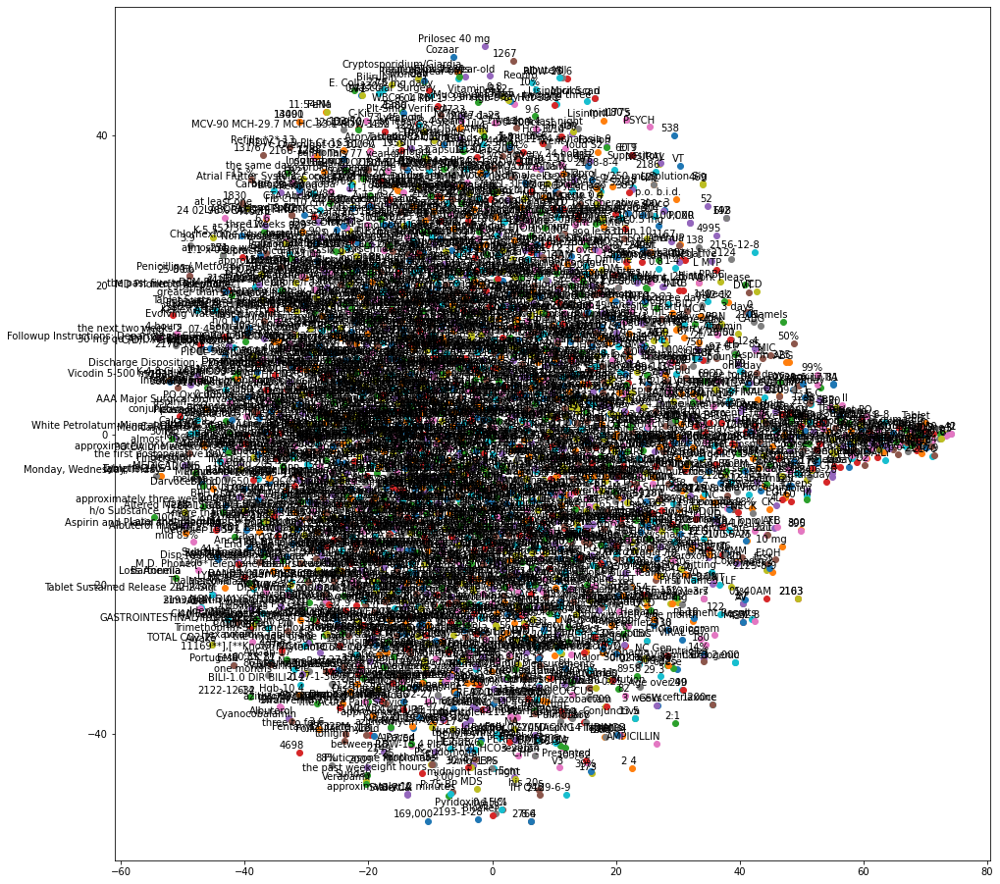

In [57]:
tsne_plot(model1)

In [103]:
dt_notes['notes_cleaned'] = dt_notes.apply(lambda x: gensim.utils.simple_preprocess(x))
print(dt_notes['notes_cleaned'][0])

['admission', 'date', 'discharge', 'date', 'date', 'of', 'birth', 'sex', 'service', 'surgery', 'allergies', 'percocet', 'lisinopril', 'attending', 'first', 'name', 'lf', 'chief', 'complaint', 'substernal', 'chest', 'pain', 'major', 'surgical', 'or', 'invasive', 'procedure', 'closure', 'of', 'perforated', 'ulcer', 'partial', 'gastrectomy', 'cholecystectomy', 'omental', 'patch', 'of', 'ulcer', 'history', 'of', 'present', 'illness', 'who', 'is', 'years', 'laparoscopic', 'rny', 'gastric', 'bypass', 'presents', 'to', 'ed', 'after', 'transfer', 'from', 'hospital', 'with', 'ct', 'scan', 'showing', 'mr', 'known', 'lastname', 'reports', 'sudden', 'onset', 'of', 'substernal', 'chest', 'pain', 'at', 'am', 'pain', 'was', 'severe', 'and', 'his', 'first', 'thought', 'was', 'that', 'he', 'was', 'having', 'an', 'mi', 'pain', 'unrelieved', 'with', 'attempt', 'at', 'bowel', 'movement', 'he', 'denies', 'fevers', 'chills', 'nausea', 'vomiting', 'or', 'any', 'other', 'symptoms', 'no', 'radiation', 'of', 't

In [104]:
w2v_mimic = Word2Vec(sentences=dt_notes['notes_cleaned'],vector_size=100, window=5, min_count=1,workers=cpu_count())
w2v_mimic.wv['admission']

TypeError: ignored

In [58]:
#pre-trained word2vec on google news
#!wget -c "https://s3.amazonaws.com/dl4j-distribution/GoogleNews-vectors-negative300.bin.gz"
#!wget -c "http://evexdb.org/pmresources/vec-space-models/PubMed-and-PMC-ri.tar.gz" # this will take some time, here we can try a small word2vec, which is not for medical.

In [60]:
# load pre-trained word2vec embeddings
#model = gensim.models.KeyedVectors.load_word2vec_format('PubMed-and-PMC-ri.tar.gz', binary=True)
#model = gensim.models.KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin.gz', binary=True)

In [59]:
# queen = (king - man) + woman
#result=model.most_similar(positive=['woman','king'], negative=['man'], topn=1)
#print(result)

In [61]:
#model2 = model1.build_vocab([list(model.vocab.keys())], update=True)


In [62]:
#model2 = word2vec.Word2Vec(corpus, min_count=1)
#model2 = Word2Vec(corpus,min_count=1)

In [63]:
#model2.wv['Tylenol']

# Using ScispaCy

In [64]:
!pip install scispacy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 KB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.1/71.1 KB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 17.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.5/188.5 KB 10.2 MB/s eta 0:00:00


In [110]:
import scispacy
import spacy

import en_ner_bc5cdr_md
nlp = en_ner_bc5cdr_md.load()


/usr/local/lib/python3.7/dist-packages/spacy/util.py:833: UserWarning: [W095] Model 'en_ner_bc5cdr_md' (0.4.0) was trained with spaCy v3.0 and may not be 100% compatible with the current version (3.2.4). If you see errors or degraded performance, download a newer compatible model or retrain your custom model with the current spaCy version. For more details and available updates, run: python -m spacy validate
  raise FileNotFoundError(


In [65]:
!pip install https://s3-us-west-2.amazonaws.com/ai2-s2-scispacy/releases/v0.4.0/en_ner_bc5cdr_md-0.4.0.tar.gz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 125.1/125.1 MB 3.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 14.6 MB/s eta 0:00:00
  Created wheel for en-ner-bc5cdr-md: filename=en_ner_bc5cdr_md-0.4.0-py3-none-any.whl size=125666881 sha256=1bbc5b42520defd975da7954e2cd33431787873ecf3b8b50ff732781ffff20ae
  Stored in directory: /root/.cache/pip/wheels/6a/17/04/ed8f50ffdcb9b9e4ce601c0c3cf88361f2b3f54a10c0fa0803
Successfully built en-ner-bc5cdr-md
  Attempting uninstall: typer
    Found existing installation: typer 0.4.1
    Uninstalling typer-0.4.1:
      Successfully uninstalled typer-0.4.1
  Attempting uninstall: spacy
    Found existing installation: spacy 3.2.4
    Uninstalling spacy-3.2.4:
      Successfully uninstalled spacy-3.2.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
scispacy 0.

In [105]:
dt_notes['notes_cleaned'] 

0     [admission, date, discharge, date, date, of, b...
1     [admission, date, discharge, date, service, ho...
2     [admission, date, discharge, date, date, of, b...
3     [admission, date, discharge, date, date, of, b...
4     [admission, date, discharge, date, date, of, b...
5     [admission, date, discharge, date, date, of, b...
6     [admission, date, discharge, date, date, of, b...
7     [admission, date, discharge, date, date, of, b...
8     [admission, date, discharge, date, service, me...
9     [admission, date, discharge, date, date, of, b...
10    [admission, date, discharge, date, date, of, b...
11    [admission, date, discharge, date, date, of, b...
12    [admission, date, discharge, date, date, of, b...
13    [admission, date, discharge, date, date, of, b...
14    [admission, date, discharge, date, date, of, b...
15    [admission, date, discharge, date, date, of, b...
16    [admission, date, discharge, date, date, of, b...
17    [admission, date, discharge, date, date, o

In [67]:
# load headache notes
from google.colab import files
uploaded = files.upload()

Saving 50PatientDischargeNote-Headache.txt to 50PatientDischargeNote-Headache (2).txt


In [68]:
notes = []
with open('50PatientDischargeNote-Headache.txt', 'r') as fin:
  lines = fin.readlines()
  for line in lines:
    notes.append(line)
print(notes)
print(len(notes))

["Service: MEDICINE Allergies: Penicillins / Adhesive Tape Attending:[**First Name3 (LF) 2817**] Chief Complaint: tachypnea and mental status changes Major Surgical or Invasive Procedure: none History of Present Illness: 65 yo man with CHF, DVT, ESRD on HD, metastatic poorly differentiated CA, likely NSLCA recently discharged [**4-5**] after hospitalization for cauda equina syndrome treated with XRT. This afternoon, noted to be very tachycardic and tachypnic en route to [**Hospital3 2558**] after HD, so EMS brought pt to ED. . In the ED, he was given 750mg iv levofloxacin for possible LLL airspace disease, though progression of metastatic malignancy more likely and CT chest did not show consolidation. Past Medical History: #. Onc HX: [**12-11**] pre-renal transplant CT scan chest noted enlarged RML nodule, w/ subcentimeter FDG avid scattered lymph nodes. Developed neck pain and found to have C2 pathological fracture, [**11-22**] cytology demonstrated poorly differentiated carcinoma. Li

In [69]:
df=notes

In [70]:
# Build corpus of all the entities extracted from the notes using spaCy model. 
# The corpus is an array of arrays or list of lists where each of the nested lists corresponds to a note.
corpus=[]
for row in range(0, len(df)):
  str_tokens=[]
  tokens= nlp(df[row]).ents
  for i in range(0, len(tokens)):
    str_tokens.append(tokens[i].text)
  corpus.append(list(str_tokens))
  

print(corpus)

[['Allergies', 'Penicillins', 'tachypnea', 'CHF', 'DVT', 'ESRD', 'HD', 'cauda equina syndrome', 'XRT', 'tachypnic', 'HD', 'levofloxacin', 'LLL', 'malignancy', 'neck pain', 'fracture', 'carcinoma', 'non-small cell lung carcinoma', 'RML mass and metastasis to the cervical and sacral spine', 'fracture', 'XRT', 'DVT', 'DVT', 'coumadin', 'CAD', 'OM2/3', 'ESRD', 'HD', 'MWF', 'Hypertension', 'nerve palsy', 'GSW', 'Substance abuse', 'heroin/cocaine', 'CHF', 'Parotiditis', 'inflammation', 'fibrosis', 'ETOH', 'CAD', 'kidney disease', 'GEN', 'OP clear, MMM', 'RRR', 'CTAB', 'ND', 'dry', 'asterixis', 'MCH-25.3', 'HYPOCHROM-2', 'POIKILOCY-2', 'POLYCHROM-OCCASIONAL OVALOCYT-1', 'CK-MB-NotDone', 'CO2', 'parenchymal opacities', 'pneumonia', 'pleural effusion', 'pneumothorax', 'Left basilar atelectasis', 'pulmonary embolism', 'osseous metastatic lesions', 'CHF', 'DVT', 'ESRD', 'HD', 'cauda equina syndrome', 'dexamethasone', 'hypotension', 'cancer', 'hypotension', 'oxygen desaturations', 'respiratory dis

In [71]:
!pip install gensim

In [72]:
import gensim

In [73]:
import pandas as pd
pd.options.mode.chained_assignment = None 
import numpy as np
import re

from gensim.models import word2vec

from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
%matplotlib inline

In [96]:
model = word2vec.Word2Vec(corpus, min_count=1)

In [97]:
model.wv['DVT']

array([-5.3085606e-03,  3.4721910e-03, -1.7517705e-03,  1.3984782e-04,
       -8.6551404e-04,  1.2794218e-03,  1.3106494e-03, -1.4631399e-03,
        1.8562494e-03,  3.9186084e-04,  8.1631675e-04,  1.2815397e-03,
       -2.7971973e-03,  4.4351208e-04, -1.6345723e-03, -3.0178446e-03,
        4.7664847e-03, -3.3612153e-03,  2.3069528e-03, -3.5950008e-03,
       -4.8046876e-03,  1.1436737e-03,  5.1433831e-03, -5.2812119e-04,
        3.0843974e-03, -1.1439854e-03, -2.1241256e-03,  2.2746203e-03,
       -4.8319148e-03,  3.9590057e-03,  1.8394501e-03, -9.1135968e-04,
       -1.3742090e-03, -4.4329478e-03, -4.6717090e-04,  3.6818059e-03,
        1.7904850e-03, -4.5405608e-03,  8.3365006e-04, -2.3270573e-03,
       -4.3206047e-03,  3.1436661e-03,  3.8119927e-03, -2.4852663e-04,
        3.3144099e-03,  1.5832457e-03,  1.3122577e-03, -3.7542051e-03,
        4.0262580e-04, -3.4475666e-03,  4.1241632e-03, -2.5673946e-03,
        1.3781297e-03,  3.3299953e-03, -9.6767937e-04, -6.5173098e-04,
      

In [100]:
def tsne_plot(model):
    "Creates and TSNE model and plots it"
    labels = []
    tokens = []

    for word in model.wv.vocab:
        tokens.append(model[word])
        labels.append(word)
    
    tsne_model = TSNE(perplexity=30, early_exaggeration=12, n_components=2, init='pca', n_iter=1000, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(16, 16)) 
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  import sys
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


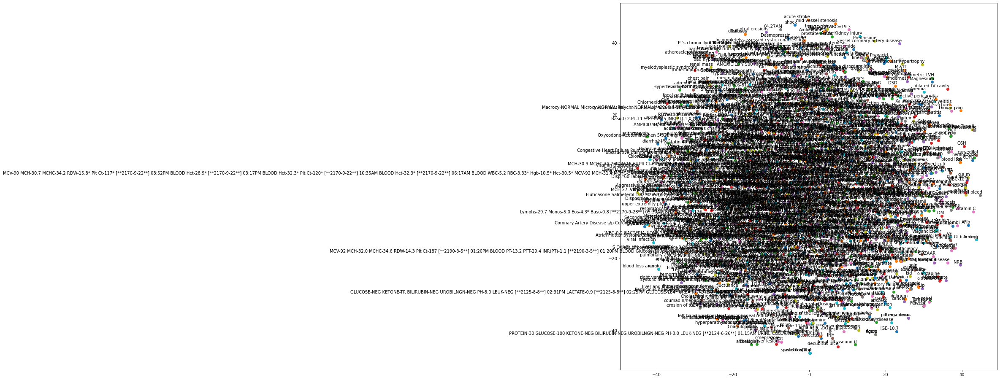

In [101]:
tsne_plot(model)

#medspacy

MedSpacy is a library tool for performing clinical NLP and text processing task. It brings together number of other packages, each of which implements specific functionality for common clinical text processing such as sentence segmentation, contextual analysis and attribute assertion and section dectection.

In [8]:
pip install medspacy

In [17]:
import medspacy
from medspacy.ner import TargetRule
from medspacy.visualization import visualize_ent

In [18]:
# load headache notes
from google.colab import files
uploaded = files.upload()

Saving 50PatientDischargeNote-Headache.txt to 50PatientDischargeNote-Headache.txt


In [19]:
with open("50PatientDischargeNote-Headache.txt") as f:
    text = f.read()

In [24]:
import medspacy
from medspacy.ner import TargetRule
from medspacy.visualization import visualize_ent

# Load medspacy model
nlp = medspacy.load()
print(nlp.pipe_names)

text = """
Past Medical History:
1. Atrial fibrillation
2. Type II Diabetes Mellitus

Assessment and Plan:
There is no evidence of pneumonia. Continue warfarin for Afib. Follow up for management of type 2 DM.
"""

# Add rules for target concept extraction
target_matcher = nlp.get_pipe("medspacy_target_matcher")
target_rules = [
    TargetRule("atrial fibrillation", "PROBLEM"),
    TargetRule("atrial fibrillation", "PROBLEM", pattern=[{"LOWER": "afib"}]),
    TargetRule("pneumonia", "PROBLEM"),
    TargetRule("Type II Diabetes Mellitus", "PROBLEM", 
              pattern=[
                  {"LOWER": "type"},
                  {"LOWER": {"IN": ["2", "ii", "two"]}},
                  {"LOWER": {"IN": ["dm", "diabetes"]}},
                  {"LOWER": "mellitus", "OP": "?"}
              ]),
    TargetRule("warfarin", "MEDICATION")
]
target_matcher.add(target_rules)

doc = nlp(text)
visualize_ent(doc)

['medspacy_pyrush', 'medspacy_target_matcher', 'medspacy_context']
